In [8]:
import gymnasium
import flappy_bird_gymnasium
import numpy as np
import pygame
import itertools
import random
import torch
import torch.nn as nn
import torch.optim as optim
from collections import deque
from enum import IntEnum
from torchvision.transforms import Compose, ToTensor, Resize, Grayscale
from flappy_bird_gymnasium.envs.flappy_bird_env import FlappyBirdEnv
from flappy_bird_gymnasium.envs.flappy_bird_env import Actions
from flappy_bird_gymnasium.envs.lidar import LIDAR
from flappy_bird_gymnasium.envs.constants import (
    PLAYER_FLAP_ACC,
    PLAYER_ACC_Y,
    PLAYER_MAX_VEL_Y,
    PLAYER_HEIGHT,
    PLAYER_VEL_ROT,
    PLAYER_WIDTH,
    PIPE_WIDTH,
    PIPE_VEL_X,
)

def new_render(self):
    """Renders the next frame."""
    if self.render_mode == "rgb_array":
        self._draw_surface(show_score=False, show_rays=False)
        # Flip the image to retrieve a correct aspect
        return np.transpose(pygame.surfarray.array3d(self._surface), axes=(1, 0, 2))
    else:
        self._draw_surface(show_score=True, show_rays=False)
        if self._display is None:
            self._make_display()

        self._update_display()
        self._fps_clock.tick(self.metadata["render_fps"])


FlappyBirdEnv.render = new_render

In [ ]:
###############
######DQN######
###############

class DQN(nn.Module):
    def __init__(self, input_dim, action_space):
        super(DQN, self).__init__()
        self.fc1 = nn.Linear(input_dim, 128)  # First hidden layer
        self.fc2 = nn.Linear(128, 128)   
        self.fc3 = nn.Linear(128, 128)      # Second hidden layer
        self.fc4 = nn.Linear(128, action_space)  # Output layer for Q-values

    def forward(self, x):
        x = torch.relu(self.fc1(x))
        x = torch.relu(self.fc2(x))
        x = torch.relu(self.fc3(x))
        return self.fc4(x)



# Replay Memory to store experiences
class ReplayMemory:
    def __init__(self, capacity):
        self.memory = deque(maxlen=capacity)

    def push(self, state, action, reward, next_state, done):
        self.memory.append((state, action, reward, next_state, done))

    def sample(self, batch_size):
        return random.sample(self.memory, batch_size)

    def __len__(self):
        return len(self.memory)


# DQN Agent Class
class DQNAgent:
    def __init__(self, 
                 env,
                 hyper ={
                          "learning_rate": 0.001,
                          "discount_factor" : 0.99,
                          "epsilon" : 1.0,
                          "epsilon_decay" :0.999,
                          "epsilon_min" : 0.01,
                          "batch_size" : 64,
                          "memory_size" : 10000,
                          "episodes" : 100000,
                          "target_update_freq" : 10
                        }
                 ):
        # Environment
        self.env = env
        self.state_dim = env.observation_space.shape[0]  # First dimension of observation
        self.action_space = env.action_space.n


        # Hyperparameters
        self.learning_rate = hyper["learning_rate"]
        self.discount_factor = hyper["discount_factor"]
        self.epsilon = hyper["epsilon"]
        self.epsilon_decay = hyper["epsilon_decay"]
        self.epsilon_min = hyper["epsilon_min"]
        self.batch_size = hyper["batch_size"]
        self.memory_size = hyper["memory_size"]
        self.episodes = hyper["episodes"]
        self.target_update_freq = hyper["target_update_freq"]

        # Initialize policy and target networks
        self.policy_net = DQN(self.state_dim, self.action_space)
        self.target_net = DQN(self.state_dim, self.action_space)
        self.target_net.load_state_dict(self.policy_net.state_dict())
        self.target_net.eval()

        # Optimizer and Replay Memory
        self.optimizer = optim.Adam(self.policy_net.parameters(), lr=self.learning_rate)
        self.memory = ReplayMemory(self.memory_size)

    def select_action(self, state, testing=False):
        """Epsilon-greedy action selection."""
        if not testing and random.random() < self.epsilon:
            return random.randint(0, self.action_space - 1)  # Random action
        else:
            with torch.no_grad():
                state = torch.tensor(state, dtype=torch.float32).unsqueeze(0)
                return self.policy_net(state).argmax(dim=1).item()

    def optimize_model(self):
        """Sample a batch from memory and optimize the policy network."""
        if len(self.memory) < self.batch_size:
            return

        batch = self.memory.sample(self.batch_size)
        states, actions, rewards, next_states, dones = zip(*batch)

        # Convert to tensors
        states = torch.tensor(states, dtype=torch.float32)
        actions = torch.tensor(actions, dtype=torch.long).unsqueeze(1)
        rewards = torch.tensor(rewards, dtype=torch.float32).unsqueeze(1)
        next_states = torch.tensor(next_states, dtype=torch.float32)
        dones = torch.tensor(dones, dtype=torch.float32).unsqueeze(1)

        # Compute Q-values and targets
        q_values = self.policy_net(states).gather(1, actions)
        next_q_values = self.target_net(next_states).max(1, keepdim=True)[0]
        targets = rewards + (self.discount_factor * next_q_values * (1 - dones))

        # Loss and backpropagation
        loss = nn.MSELoss()(q_values, targets)
        self.optimizer.zero_grad()
        loss.backward()
        self.optimizer.step()

    def train(self):
        res=[]
        """Train the agent."""
        for episode in range(self.episodes):
            state, _ = self.env.reset()
            done = False
            total_reward = 0

            while not done:
                # Select and execute action
                action = self.select_action(state)
                next_state, reward, done, _, _ = self.env.step(action)
                self.memory.push(state, action, reward, next_state, done)
                state = next_state
                total_reward += reward

                # Optimize model
                self.optimize_model()

            # Update target network periodically
            if episode % self.target_update_freq == 0:
                self.target_net.load_state_dict(self.policy_net.state_dict())

            # Decay epsilon
            self.epsilon = max(self.epsilon_min, self.epsilon * self.epsilon_decay)

            res.append(total_reward)
            print(f"Episode: {episode + 1}, Total Reward: {total_reward}, Epsilon: {self.epsilon:.4f}")

        self.env.close()
        print("Training complete!")

        return res

    def test(self, num_episodes=10,render="human"):
        """Test the trained policy with real-time rendering."""
        print("\nTesting the trained policy...\n")
        self.epsilon = 0.0  # Disable exploration
        test_env = gymnasium.make("FlappyBird-v0", render_mode=render,use_lidar=True)  # Render in "human" mode 
        total_rewards = []

        for episode in range(num_episodes):
            state, _ = test_env.reset()
            done = False
            total_reward = 0

            while not done:
                action = self.select_action(state, testing=True)
                next_state, reward, done, _, _ = test_env.step(action)
                state = next_state
                total_reward += reward

            total_rewards.append(total_reward)
            print(f"Test Episode: {episode + 1}, Total Reward: {total_reward}")

        avg_reward = np.mean(total_rewards)
        print(f"\nAverage Reward over {num_episodes} Test Episodes: {avg_reward}")
        test_env.close()
        return total_rewards
    
import gymnasium
import itertools
import pickle
import gc


# Initialize environment
env = gymnasium.make("FlappyBird-v0", render_mode="rgb_array", use_lidar=True)

# Hyperparameters
hyper = {
    "learning_rate": [0.001, 0.005],
    "discount_factor": 0.99,
    "epsilon": 1.0,
    "epsilon_decay": [0.995, 0.999],
    "epsilon_min": 0.01,
    "batch_size": 64,
    "memory_size": 10000,
    "episodes": 20000,
    "target_update_freq": [10, 20]
}

param_combinations = itertools.product(
    hyper["learning_rate"], 
    hyper["epsilon_decay"], 
    hyper["target_update_freq"]
)

# Initialize result dictionaries
exp_res = {}
test_res = {}

# Iterate through parameter combinations
for lr, epsilon_decay, target_update_freq in param_combinations:
    current_hyperparams = {
        "learning_rate": lr,
        "discount_factor": hyper["discount_factor"],
        "epsilon": hyper["epsilon"],
        "epsilon_decay": epsilon_decay,
        "epsilon_min": hyper["epsilon_min"],
        "batch_size": hyper["batch_size"],
        "memory_size": hyper["memory_size"],
        "episodes": hyper["episodes"],
        "target_update_freq": target_update_freq
    }
    
    try:
        # Train the agent
        agent = DQNAgent(env, current_hyperparams)
        exp_key = f"lr={lr}_decay={epsilon_decay}_freq={target_update_freq}"
        exp_res[exp_key] = agent.train()
        
        # Test the agent
        test_res[exp_key] = agent.test(num_episodes=5000, render=None)
        
        # Save intermediate results
        with open("exp_res.pkl", "wb") as f:
            pickle.dump(exp_res, f)
        with open("test_res.pkl", "wb") as f:
            pickle.dump(test_res, f)
        
        print(f"Finished training and testing for: {exp_key}")
    
    finally:
        # Free resources
        del agent
        gc.collect()
        env.close()


with open("exp_res.pkl", "rb") as f:
    exp_res = pickle.load(f)
with open("test_res.pkl", "rb") as f:
    test_res = pickle.load(f)

print("All parameter combinations processed.")


NameError: name 'nn' is not defined

In [ ]:
#############################
######       AC        ######
#############################


class ActorCriticNet(nn.Module):
    def __init__(self, input_dim, action_space):
        super(ActorCriticNet, self).__init__()
        # Shared layers
        self.fc1 = nn.Linear(input_dim, 128)
        self.fc2 = nn.Linear(128, 128)
        
        # Actor head
        self.actor = nn.Linear(128, action_space)
        
        # Critic head
        self.critic = nn.Linear(128, 1)

    def forward(self, x):
        x = torch.relu(self.fc1(x))
        x = torch.relu(self.fc2(x))
        policy_logits = torch.softmax(self.actor(x), dim=-1)  # Action probabilities
        value = self.critic(x)  # State value
        return policy_logits, value
    
    
class ActorCriticAgent:
    def __init__(self, env):
        # Environment
        self.env = env
        self.state_dim = env.observation_space.shape[0]  # First dimension of observation
        self.action_space = env.action_space.n

        # Hyperparameters
        self.learning_rate = 0.001
        self.discount_factor = 0.99
        self.episodes = 5000

        # Initialize actor-critic network
        self.actor_critic_net = ActorCriticNet(self.state_dim, self.action_space)
        self.optimizer = optim.Adam(self.actor_critic_net.parameters(), lr=self.learning_rate)

        # Memory for rewards, values, and log probabilities
        self.log_probs = []
        self.rewards = []
        self.values = []

    def __init__(self, env, config):
        self.env = env
        self.state_dim = env.observation_space.shape[0]
        self.action_space = env.action_space.n

        # Network hyperparameters
        self.actor_lr = config.get('actor_lr', 0.001)
        self.critic_lr = config.get('critic_lr', 0.005)
        self.hidden_size = config.get('hidden_size', 128)
        
        # Algorithm hyperparameters 
        self.gamma = config.get('gamma', 0.99)
        self.gae_lambda = config.get('gae_lambda', 0.95)
        self.entropy_coef = config.get('entropy_coef', 0.01)
        self.value_loss_coef = config.get('value_loss_coef', 0.5)
        self.max_grad_norm = config.get('max_grad_norm', 0.5)
        self.episodes = config.get('episodes', 5000)

        self.actor_critic_net = ActorCriticNet(self.state_dim, self.action_space)
        
        # Separate optimizers for actor and critic
        self.actor_optimizer = optim.Adam(self.actor_critic_net.actor.parameters(), lr=self.actor_lr)
        self.critic_optimizer = optim.Adam(self.actor_critic_net.critic.parameters(), lr=self.critic_lr)
    def select_action(self, state):
        """Select an action based on the policy."""
        state = torch.tensor(state, dtype=torch.float32).unsqueeze(0)
        policy_logits, value = self.actor_critic_net(state)
        action_dist = torch.distributions.Categorical(policy_logits)
        action = action_dist.sample()
        
        # Store log probability and value
        self.log_probs.append(action_dist.log_prob(action))
        self.values.append(value)
        return action.item()

    def compute_returns(self):
        """Compute discounted returns for each time step."""
        returns = []
        G = 0
        for reward in reversed(self.rewards):
            G = reward + self.discount_factor * G
            returns.insert(0, G)
        returns = torch.tensor(returns, dtype=torch.float32)
        return returns

    def train_step(self):
        """Perform a training step after one episode."""
        returns = self.compute_returns()
        values = torch.cat(self.values).squeeze()
        log_probs = torch.cat(self.log_probs)
        
        # Compute advantage
        advantage = returns - values.detach()  # Detach critic from the actor's gradient computation
        
        # Actor loss (policy gradient with advantage)
        actor_loss = -(log_probs * advantage).mean()

        # Critic loss (value estimation error)
        critic_loss = torch.nn.functional.mse_loss(values, returns)

        # Total loss
        loss = actor_loss + critic_loss

        self.optimizer.zero_grad()
        loss.backward()
        self.optimizer.step()

        # Clear memory
        self.log_probs = []
        self.rewards = []
        self.values = []

    def train(self):
        res = []
        """Train the agent."""
        for episode in range(self.episodes):
            state, _ = self.env.reset()
            done = False
            total_reward = 0

            while not done:
                action = self.select_action(state)
                next_state, reward, done, _, _ = self.env.step(action)
                
                self.rewards.append(reward)
                state = next_state
                total_reward += reward

            # Perform a training step after the episode ends
            self.train_step()

            res.append(total_reward)
            print(f"Episode: {episode + 1}, Total Reward: {total_reward}")

        self.env.close()
        print("Training complete!")
        return res

    def test(self, num_episodes=10, render="human"):
        """Test the trained policy with real-time rendering."""
        print("\nTesting the trained policy...\n")
        test_env = gymnasium.make("FlappyBird-v0", render_mode=render, use_lidar=True)
        total_rewards = []

        for episode in range(num_episodes):
            state, _ = test_env.reset()
            done = False
            total_reward = 0

            while not done:
                state = torch.tensor(state, dtype=torch.float32).unsqueeze(0)
                policy_logits, _ = self.actor_critic_net(state)
                action = torch.argmax(policy_logits).item()  # Select action with highest probability
                next_state, reward, done, _, _ = test_env.step(action)
                state = next_state
                total_reward += reward

            total_rewards.append(total_reward)
            print(f"Test Episode: {episode + 1}, Total Reward: {total_reward}")

        avg_reward = np.mean(total_rewards)
        print(f"\nAverage Reward over {num_episodes} Test Episodes: {avg_reward}")
        test_env.close()

        return total_rewards

In [9]:
######## Optimized AC ########

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import numpy as np
from torch.distributions import Categorical

class ActorCriticNet(nn.Module):
    def __init__(self, input_dim, action_space):
        super().__init__()
        self.shared = nn.Sequential(
            nn.Linear(input_dim, 128),
            nn.ReLU(),
            nn.Linear(128, 128),
            nn.ReLU()
        )
        self.actor = nn.Sequential(
            nn.Linear(128, action_space)
        )
        self.critic = nn.Linear(128, 1)

    def forward(self, x):
        shared = self.shared(x)
        return F.softmax(self.actor(shared), dim=-1), self.critic(shared)

class OptimizedActorCritic:
    def __init__(self, env, config):
        self.device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
        self.env = env
        self.state_dim = env.observation_space.shape[0]
        self.action_space = env.action_space.n
        
        # Parameters
        self.actor_lr = config.get('actor_lr', 0.001)
        self.critic_lr = config.get('critic_lr', 0.005)
        self.gamma = config.get('gamma', 0.99)
        self.gae_lambda = config.get('gae_lambda', 0.95)
        self.entropy_coef = config.get('entropy_coef', 0.01)
        self.value_loss_coef = config.get('value_loss_coef', 0.5)
        self.max_grad_norm = config.get('max_grad_norm', 0.5)
        self.episodes = config.get('episodes', 5000)
        
        self.network = ActorCriticNet(self.state_dim, self.action_space).to(self.device)
        self.actor_optimizer = optim.Adam(self.network.parameters(), lr=self.actor_lr)
        self.critic_optimizer = optim.Adam(self.network.parameters(), lr=self.critic_lr)
        
        self.log_probs = []
        self.values = []
        self.rewards = []
        self.masks = []

    def select_action(self, state):
        state = torch.FloatTensor(state).unsqueeze(0).to(self.device)
        with torch.no_grad():
            probs, value = self.network(state)
            dist = Categorical(probs)
            action = dist.sample()
            log_prob = dist.log_prob(action)
        
        return action.item(), log_prob.item(), value.item()

    def compute_gae(self):
        returns = []
        gae = 0
        for step in reversed(range(len(self.rewards))):
            if step == len(self.rewards) - 1:
                next_value = 0
            else:
                next_value = self.values[step + 1]
                
            delta = self.rewards[step] + self.gamma * next_value * self.masks[step] - self.values[step]
            gae = delta + self.gamma * self.gae_lambda * self.masks[step] * gae
            returns.insert(0, gae + self.values[step])
            
        return torch.FloatTensor(returns).to(self.device)

    def train_step(self):
        returns = self.compute_gae()
        
        values = torch.FloatTensor(self.values).to(self.device)
        log_probs = torch.FloatTensor(self.log_probs).to(self.device)
        advantages = returns - values
        advantages = (advantages - advantages.mean()) / (advantages.std() + 1e-8)
        
        states = torch.FloatTensor(self.states).to(self.device)
        actions = torch.LongTensor(self.actions).to(self.device)
        
        # Forward pass
        new_probs, new_values = self.network(states)
        dist = Categorical(new_probs)
        new_log_probs = dist.log_prob(actions)
        entropy = dist.entropy().mean()
        
        # Actor loss
        ratio = torch.exp(new_log_probs - log_probs)
        surr1 = ratio * advantages
        actor_loss = -(surr1.mean() + self.entropy_coef * entropy)
        
        # Critic loss
        critic_loss = self.value_loss_coef * F.mse_loss(new_values.squeeze(-1), returns)
        
        # Total loss
        total_loss = actor_loss + critic_loss
        
        # Optimize
        self.actor_optimizer.zero_grad()
        self.critic_optimizer.zero_grad()
        total_loss.backward()
        torch.nn.utils.clip_grad_norm_(self.network.parameters(), self.max_grad_norm)
        self.actor_optimizer.step()
        self.critic_optimizer.step()
        
        # Clear memory
        self.log_probs.clear()
        self.values.clear()
        self.rewards.clear()
        self.masks.clear()
        self.states.clear()
        self.actions.clear()

    def train(self):
        rewards_history = []
        
        for episode in range(self.episodes):
            state, _ = self.env.reset()
            done = False
            total_reward = 0
            
            self.states = []
            self.actions = []
            
            while not done:
                action, log_prob, value = self.select_action(state)
                next_state, reward, done, truncated, _ = self.env.step(action)
                
                self.states.append(state)
                self.actions.append(action)
                self.rewards.append(reward)
                self.log_probs.append(log_prob)
                self.values.append(value)
                self.masks.append(1 - done)
                
                state = next_state
                total_reward += reward
                
                if truncated:
                    break
            
            self.train_step()
            rewards_history.append(total_reward)
            
            if episode % 100 == 0:
                avg_reward = np.mean(rewards_history[-100:])
                print(f"Episode {episode}, Reward: {total_reward:.2f}, Avg: {avg_reward:.2f}")
        
        return rewards_history

    def test(self, num_episodes=10):
        total_rewards = []
        for episode in range(num_episodes):
            state, _ = self.env.reset()
            total_reward = 0
            done = False
            
            while not done:
                state = torch.FloatTensor(state).unsqueeze(0).to(self.device)
                with torch.no_grad():
                    probs, _ = self.network(state)
                action = probs.argmax().item()
                state, reward, done, truncated, _ = self.env.step(action)
                total_reward += reward
                if truncated:
                    break
            
            total_rewards.append(total_reward)
            print(f"Test Episode {episode}, Total Reward: {total_reward}")
        
        print(f"Average Test Reward: {np.mean(total_rewards):.2f}")
        return total_rewards
    
import gymnasium
import itertools
import pickle
import gc

env = gymnasium.make("FlappyBird-v0", render_mode="rgb_array", use_lidar=True)

# Real
hyper = {
   "actor_lr": [0.0001, 0.0005],
   "critic_lr": [0.001, 0.005], 
   "gamma": 0.99,
   "gae_lambda": [0.9, 0.95],
   "entropy_coef": [0.01, 0.05],
   "value_loss_coef": [0.5, 1.0],
   "max_grad_norm": 0.5,
   "episodes": 20000
}

# For test
# hyper = {
#    "actor_lr": [0.0005],
#    "critic_lr": [0.005], 
#    "gamma": 0.99,
#    "gae_lambda": [0.9, 0.95],
#    "entropy_coef": [0.01, 0.05],
#    "value_loss_coef": [0.5, 1.0],
#    "max_grad_norm": 0.5,
#    "episodes": 200
# }

param_combinations = itertools.product(
   hyper["actor_lr"],
   hyper["critic_lr"], 
   hyper["gae_lambda"],
   hyper["entropy_coef"],
   hyper["value_loss_coef"]
)

exp_res = {}
test_res = {}

for actor_lr, critic_lr, gae_lambda, entropy_coef, value_loss_coef in param_combinations:
   current_hyperparams = {
       "actor_lr": actor_lr,
       "critic_lr": critic_lr,
       "gamma": hyper["gamma"],
       "gae_lambda": gae_lambda,
       "entropy_coef": entropy_coef,
       "value_loss_coef": value_loss_coef,
       "max_grad_norm": hyper["max_grad_norm"],
       "episodes": hyper["episodes"]
   }
   
   try:
       agent = OptimizedActorCritic(env, current_hyperparams)
       exp_key = f"a_lr={actor_lr}_c_lr={critic_lr}_gae={gae_lambda}_ent={entropy_coef}_val={value_loss_coef}"
       exp_res[exp_key] = agent.train()
       test_res[exp_key] = agent.test(num_episodes=5000)
       
       with open("ac_exp_res.pkl", "wb") as f:
           pickle.dump(exp_res, f)
       with open("ac_test_res.pkl", "wb") as f:
           pickle.dump(test_res, f)
           
       print(f"Completed: {exp_key}")
       
   finally:
       del agent
       gc.collect()
       env.close()

with open("ac_exp_res.pkl", "rb") as f:
   exp_res = pickle.load(f)
with open("ac_test_res.pkl", "rb") as f:
   test_res = pickle.load(f)

print("Experiment complete")


Episode 0, Reward: -8.70, Avg: -8.70
Episode 100, Reward: -9.30, Avg: -8.37
Episode 200, Reward: -9.30, Avg: -9.30
Episode 300, Reward: -9.30, Avg: -9.30
Episode 400, Reward: -9.30, Avg: -9.30
Episode 500, Reward: -9.30, Avg: -9.30
Episode 600, Reward: -9.30, Avg: -9.30
Episode 700, Reward: -9.30, Avg: -9.30
Episode 800, Reward: -9.30, Avg: -9.30
Episode 900, Reward: -9.30, Avg: -9.30
Episode 1000, Reward: -9.30, Avg: -9.30
Episode 1100, Reward: -9.30, Avg: -9.30
Episode 1200, Reward: -9.30, Avg: -9.30
Episode 1300, Reward: -9.30, Avg: -9.30
Episode 1400, Reward: -9.30, Avg: -9.30
Episode 1500, Reward: -9.30, Avg: -9.30
Episode 1600, Reward: -9.30, Avg: -9.30
Episode 1700, Reward: -9.30, Avg: -9.30
Episode 1800, Reward: -9.30, Avg: -9.30
Episode 1900, Reward: -9.30, Avg: -9.30
Episode 2000, Reward: -9.30, Avg: -9.30
Episode 2100, Reward: -9.30, Avg: -9.30
Episode 2200, Reward: -9.30, Avg: -9.30
Episode 2300, Reward: -9.30, Avg: -9.30
Episode 2400, Reward: -9.30, Avg: -9.30
Episode 2500

C:\Users\user\AppData\Local\Temp\ipykernel_38336\2865349045.py:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap("cool", num_combinations)


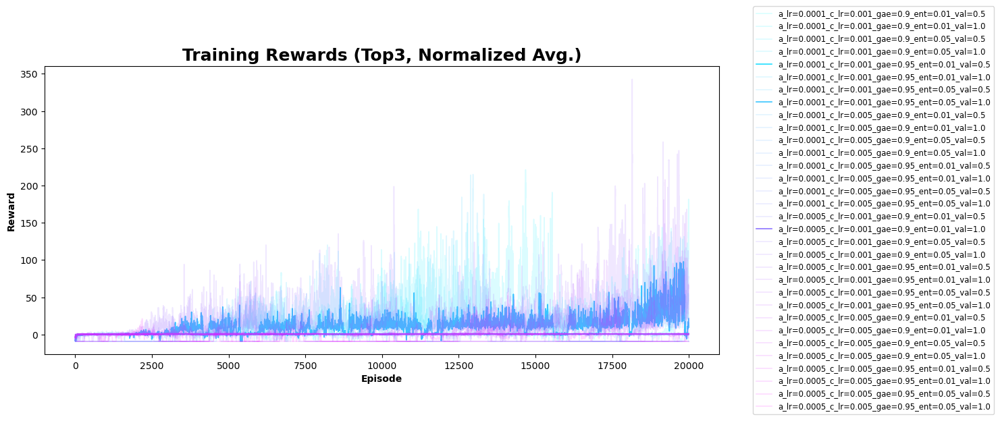

C:\Users\user\AppData\Local\Temp\ipykernel_38336\2865349045.py:13: RuntimeWarning: divide by zero encountered in scalar divide
  cv_rewards = {key: np.mean(rewards)/np.std(rewards) for key, rewards in rewards_dict.items()}


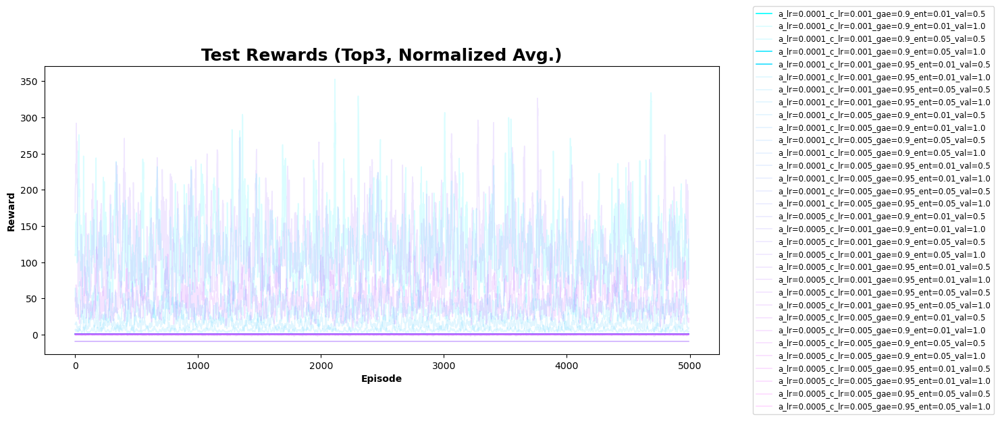

In [10]:
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.cm as cm
from matplotlib.font_manager import FontProperties


def smooth_data(data, window_size=5):
    """Apply a simple moving average smoothing to the data."""
    return np.convolve(data, np.ones(window_size)/window_size, mode='valid')

def plot_rewards_with_opacity(rewards_dict, title, xlabel, ylabel, img_name):
    # Calculate coefficients of variation
    cv_rewards = {key: np.mean(rewards)/np.std(rewards) for key, rewards in rewards_dict.items()}  
    top3_keys = sorted(cv_rewards, key=cv_rewards.get, reverse=True)[:3]
    
    # Set up the figure and axis
    fig, ax = plt.subplots(figsize=(15, 6))
    num_combinations = len(rewards_dict)
    cmap = cm.get_cmap("cool", num_combinations)
    
    # Loop through each hyperparameter combination
    for idx, (key, rewards) in enumerate(rewards_dict.items()):
        # Smooth the rewards using moving average
        smoothed_rewards = smooth_data(rewards, window_size=10)
        
        # Choose a color for the line based on the index
        color = cmap(idx)
        
        # Adjust opacity for non-top3 combinations
        alpha = 1.0 if key in top3_keys else 0.15
        
        # Plot the smoothed data with a linewidth for visibility
        ax.plot(range(1, len(smoothed_rewards) + 1), smoothed_rewards, label=key, color=color, alpha=alpha, linewidth=1.2)
    
    # Set title with bold font
    ax.set_title(title, fontweight='bold', fontsize=18)
    ax.set_xlabel(xlabel, fontweight='bold')
    ax.set_ylabel(ylabel, fontweight='bold')
    
    # Create a FontProperties object for the legend title to make it bold
    font_props = FontProperties(weight='bold')
    
    # Place the legend outside the figure on the middle-right
    ax.legend(loc='center left', 
              bbox_to_anchor=(1.05, 0.5),  # Position the legend box outside to the right
              borderaxespad=0., 
              fancybox=True, 
              fontsize='small', 
              markerscale=0.5, 
            
              title_fontproperties=font_props)  # Make the title bold
    
    # Save the figure and show the plot
    fig.savefig(f'img/{img_name}.png', dpi=600) 
    plt.tight_layout()  # Ensures the legend does not get clipped
    plt.show()

# Plot for exp_res (training rewards)
plot_rewards_with_opacity(exp_res, "Training Rewards (Top3, Normalized Avg.)", "Episode", "Reward", "TR_rewards_cv.png")

# Plot for test_res (test rewards)
plot_rewards_with_opacity(test_res, "Test Rewards (Top3, Normalized Avg.)", "Episode", "Reward", "Ts_rewards_cv.png")


C:\Users\user\AppData\Local\Temp\ipykernel_38336\3705388015.py:18: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap("cool", num_combinations)


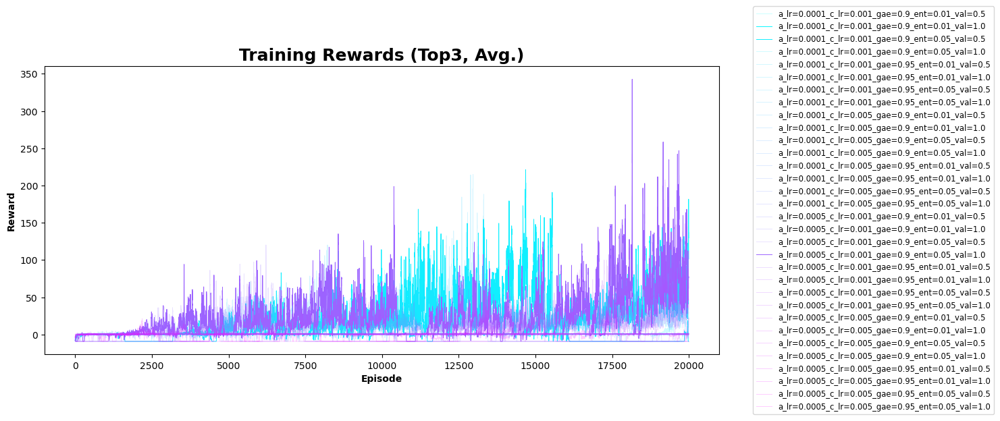

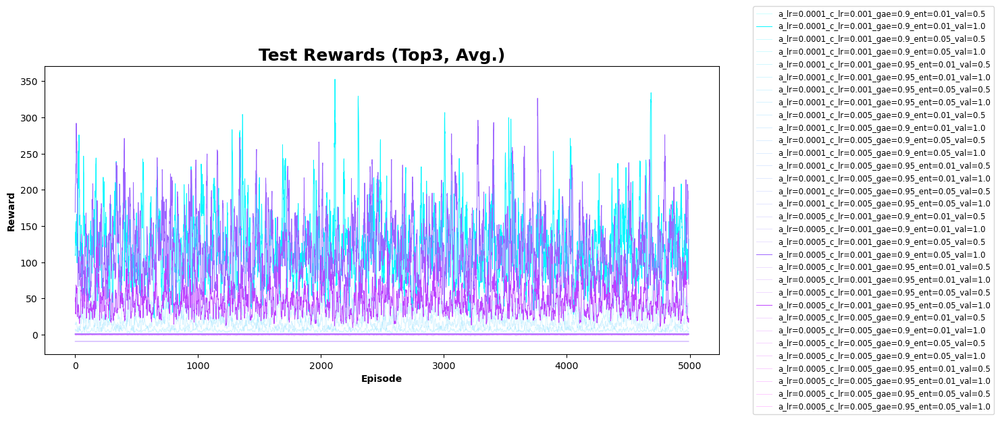

In [11]:
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.cm as cm

def smooth_data(data, window_size=5):
    """Apply a simple moving average smoothing to the data."""
    return np.convolve(data, np.ones(window_size)/window_size, mode='valid')

def plot_rewards_with_opacity(rewards_dict, title, xlabel, ylabel, img_name):

    avg_rewards = {key: np.mean(rewards) for key, rewards in rewards_dict.items()} ##coefficients of variation
    top3_keys = sorted(avg_rewards, key=avg_rewards.get, reverse=True)[:3]
    
    

    fig, ax = plt.subplots(figsize=(15, 6))
    num_combinations = len(rewards_dict)
    cmap = cm.get_cmap("cool", num_combinations)
    
    # Loop through each hyperparameter combination and plot with a color from the colormap
    for idx, (key, rewards) in enumerate(rewards_dict.items()):

        smoothed_rewards = smooth_data(rewards, window_size=10)
        color = cmap(idx)  # Get the color for this hyperparameter combination
        # Adjust opacity for non-top3 combinations
        alpha = 1.0 if key in top3_keys else 0.2
        ax.plot(range(1, len(smoothed_rewards) + 1), smoothed_rewards, label=key, color=color, alpha=alpha,linewidth=0.7)
    
    # Set title with bold font
    ax.set_title(title, fontweight='bold',fontsize=18)
    ax.set_xlabel(xlabel,fontweight='bold')
    ax.set_ylabel(ylabel,fontweight='bold')
    
    
    # Place the legend in the bottom-right corner, remove title, and make it smaller
    ax.legend(loc='center left', 
              bbox_to_anchor=(1.05, 0.5),  # Position the legend box outside to the right
              borderaxespad=0., 
              fancybox=True, 
              fontsize='small', 
              markerscale=0.5, 
            )  # Make the title bold
    fig.savefig(f'img/{img_name}.png',dpi=600) 
    plt.tight_layout()  # Ensures the legend does not get clipped
    plt.show()

# Plot for exp_res (training rewards)
plot_rewards_with_opacity(exp_res, "Training Rewards (Top3, Avg.)", "Episode", "Reward","TR_rewards_avg.png")

# Plot for test_res (test rewards)
plot_rewards_with_opacity(test_res, "Test Rewards (Top3, Avg.)", "Episode", "Reward","Ts_rewards_avg.png")
